Problem Statement:


Rain Prediction –Weather forecasting


Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:


1. Problem Statement:


a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.


b) Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

In [101]:
#Lets imoport necessory libraries
import pandas as pd
import numpy as np

#For Visualization
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

#import plotly
import warnings
warnings.filterwarnings('ignore')

In [102]:
#Lets Load the dataset
pd.set_option("display.max_columns",None)
data=pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
data.head()


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [103]:
#Lets check the shape of the dataset
data.shape

(8425, 23)

So, Here we have 8428 rows and 23 columns.

In [104]:
#Lets check for isnull
data.isna().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Here we have lots of null values. Lets see the sum of nulls

In [105]:
data.isna().sum().sum()

19472

So, Here we have 19472 Null in our dataset

In [106]:
#Lets Check for all Columns Name
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [107]:
#Lets check for datatype
data.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

So, Here we have Object and Float type data.

In [108]:
#Lets check for info of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

In [109]:
#Lets See all the unique Values in all Columns
data.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

# Feature Engineering and Data Cleaning

As we seen above Date Column is Numerical Column But its Shows as a Object Column

In [110]:
#lets Convert in Date Time 
data['Date'] = pd.to_datetime(data['Date'])

In [111]:
#Lets Confirm
data.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

In [112]:
#Extracting Day from Date_of_journey column
data['Day'] = pd.to_datetime(data.Date,format="%d/%m/%Y").dt.day

#Extracting Month from Date_of_journey column
data['Month'] = pd.to_datetime(data.Date, format="%d/%m/%Y").dt.month

#Extracting Year from Date_of_journey column
data['Year'] = pd.to_datetime(data.Date, format="%d/%m/%Y").dt.year

In [113]:
#Lets Delete DATE Columns
data.drop(columns='Date',inplace=True)

In [114]:
#Lets Check
data.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,5,12,2008


# Treat Null Values by Fillna Method

In [115]:
#Filling null values in MinTemp with it's mean
data['MinTemp'] = data['MinTemp'].fillna(data['MinTemp'].mean())

#Filling null values in MaxTemp with it's mean
data['MaxTemp'] = data['MaxTemp'].fillna(data['MaxTemp'].mean())

#Filling null values in Rainfall with it's mode, as most of the rows have 0 rainfall.
data['Rainfall'] = data['Rainfall'].fillna(data['Rainfall'].mode()[0])

#Filling null values in Evaporation with it's mean
data['Evaporation'] = data['Evaporation'].fillna(data['Evaporation'].mean())

#Filling null values in Sunshine with it's mean
data['Sunshine'] = data['Sunshine'].fillna(data['Sunshine'].mean())

#Filling null values in WindGustDir with it's mode
data['WindGustDir'] = data['WindGustDir'].fillna(data['WindGustDir'].mode()[0])

#Filling null values in WindGustSpeed with it's mean
data['WindGustSpeed'] = data['WindGustSpeed'].fillna(data['WindGustSpeed'].mean())

#Filling null values in WindDir9am with it's mode
data['WindDir9am'] = data['WindDir9am'].fillna(data['WindDir9am'].mode()[0])

#Filling null values in WindDir3pm with it's mode
data['WindDir3pm'] = data['WindDir3pm'].fillna(data['WindDir3pm'].mode()[0])

#Filling null values in WindSpeed9am with it's mean
data['WindSpeed9am'] = data['WindSpeed9am'].fillna(data['WindSpeed9am'].mean())

#Filling null values in WindSpeed3pm with it's mean
data['WindSpeed3pm'] = data['WindSpeed3pm'].fillna(data['WindSpeed3pm'].mean())

#Filling null values in Humidity9am with it's mean
data['Humidity9am'] = data['Humidity9am'].fillna(data['Humidity9am'].mean())

#Filling null values in Humidity3pm with it's mean
data['Humidity3pm'] = data['Humidity3pm'].fillna(data['Humidity3pm'].mean())

#Filling null values in Pressure9am with it's mean
data['Pressure9am'] = data['Pressure9am'].fillna(data['Pressure9am'].mean())

#Filling null values in Pressure3pm with it's mean
data['Pressure3pm'] = data['Pressure3pm'].fillna(data['Pressure3pm'].mean())

#Filling null values in Cloud9am with it's mean
data['Cloud9am'] = data['Cloud9am'].fillna(data['Cloud9am'].mean())

#Filling null values in Cloud3pm with it's mean
data['Cloud3pm'] = data['Cloud3pm'].fillna(data['Cloud3pm'].mean())

#Filling null values in Temp9am with it's mean
data['Temp9am'] = data['Temp9am'].fillna(data['Temp9am'].mean())

#Filling null values in Temp3pm with it's mean
data['Temp3pm'] = data['Temp3pm'].fillna(data['Temp3pm'].mean())

#Filling null values in Temp3pm with it's mean
data['Temp3pm'] = data['Temp3pm'].fillna(data['Temp3pm'].mean())

#Filling null values in RainToday with it's mode
data['RainToday'] = data['RainToday'].fillna(data['RainToday'].mode()[0])

#Filling null values in RainTomorrow with it's mode
data['RainTomorrow'] = data['RainTomorrow'].fillna(data['RainTomorrow'].mode()[0])

In [116]:
#Lets Confirm
data.isna().sum().sum()

0

So, Here we can see that we dont have any nulls

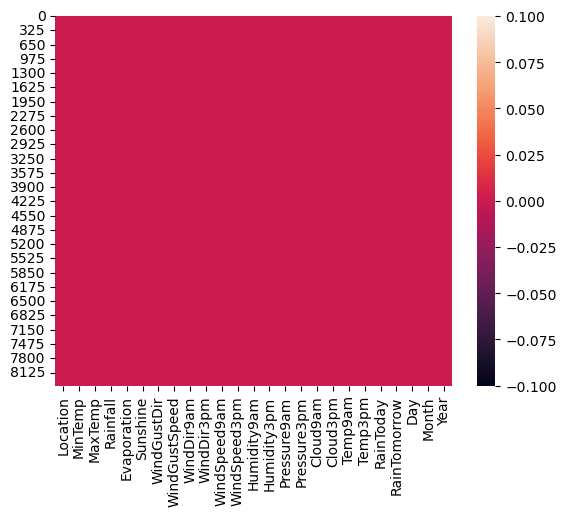

In [117]:
#Lets plot heatmap and check for isnull
sns.heatmap(data.isna())
plt.show()

Here we confirm that we dont have any nulls.

# Statistical Summary of Dataset

In [118]:
#Lets plot Data Description
data.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,8425.0,13.193305,5.379488,-2.0,9.300000,13.200000,17.300000,28.5
MaxTemp,8425.0,23.859976,6.114516,8.2,19.300000,23.300000,28.000000,45.5
Rainfall,8425.0,2.725982,10.319872,0.0,0.000000,0.000000,0.800000,371.0
Evaporation,8425.0,5.389395,3.852004,0.0,4.000000,5.389395,5.389395,145.0
Sunshine,8425.0,7.632205,2.825451,0.0,7.632205,7.632205,8.900000,13.9
WindGustSpeed,8425.0,40.174469,13.776101,7.0,31.000000,40.174469,48.000000,107.0
WindSpeed9am,8425.0,13.847646,10.128579,0.0,6.000000,13.000000,20.000000,63.0
WindSpeed3pm,8425.0,18.533662,9.704759,0.0,11.000000,19.000000,24.000000,83.0
Humidity9am,8425.0,67.822496,16.774231,10.0,56.000000,68.000000,80.000000,100.0
Humidity3pm,8425.0,51.249790,18.311894,6.0,39.000000,51.000000,63.000000,99.0


Observation

    We Dont have null Values

    Evaporation , Rainfall ,WindGustSpeed ,WindSpeed9am are Have Outliers

# Data Visualization

In [119]:
#checking categorical columns
cat_col=[]
for i in data.dtypes.index:
    if data.dtypes[i]=='object':
        cat_col.append(i)
print(cat_col)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [120]:
# checking for numerical columns
num_col=[]
for i in data.dtypes.index:
    if data.dtypes[i]!='object':
        num_col.append(i)
print(num_col)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


# Univariate Ananlysis Categorical Columns

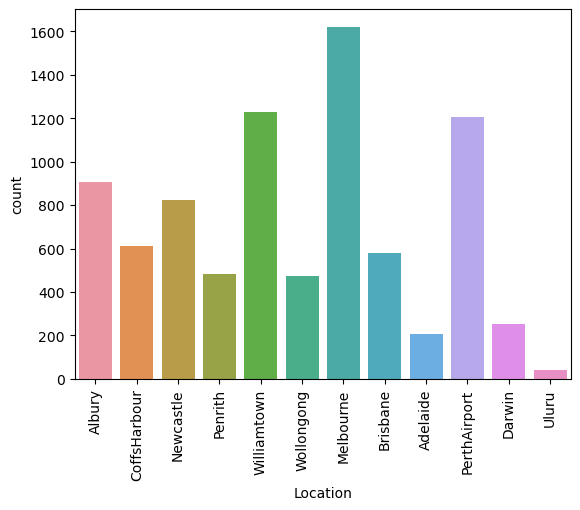

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64

In [121]:
#Lets plot all categorical columns in One Code
sns.countplot(x='Location',data=data)
plt.xticks(rotation=90)
plt.show()
data.Location.value_counts()

We have the highest rainfall data from Melbourbne and least from Uluru

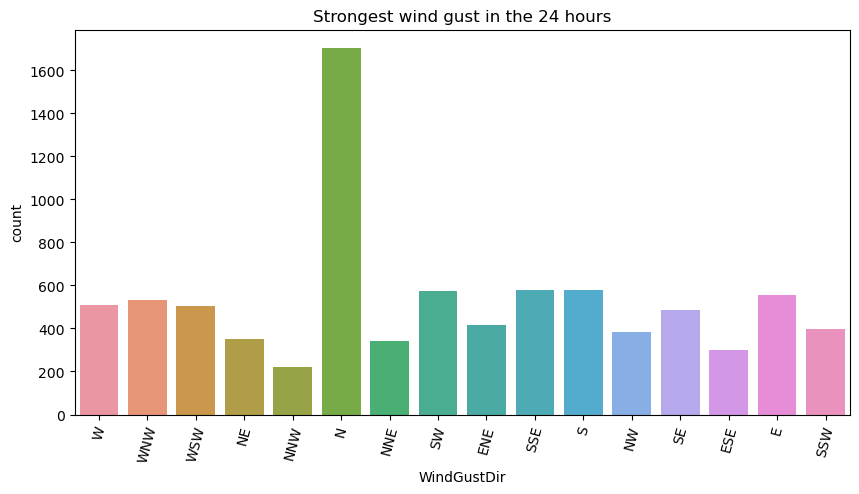

In [122]:
# Visualizing the direction of the strongest wind gust in the 24 hours to midnight
plt.figure(figsize=(10,5))
sns.countplot(data["WindGustDir"])
plt.title("Strongest wind gust in the 24 hours")
plt.xticks(rotation=75)
plt.show()

We can clearly see that the wind gust was strongest towards the north, followed by the SW, SSE, S, WNW.

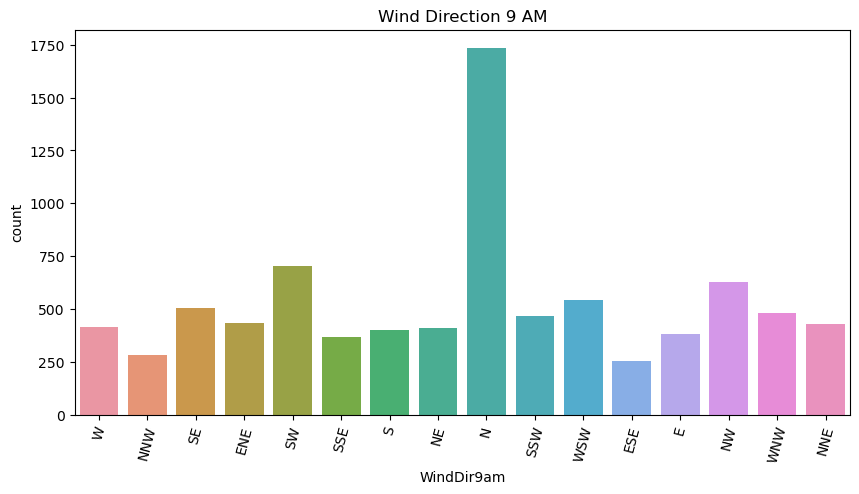

In [123]:
#Visualization of wind at 9 am
plt.figure(figsize=(10,5))
sns.countplot(data["WindDir9am"])
plt.title("Wind Direction 9 AM")
plt.xticks(rotation=75)
plt.show()

In the plots we can clearly see that the wing direction was towards the N at 9am.

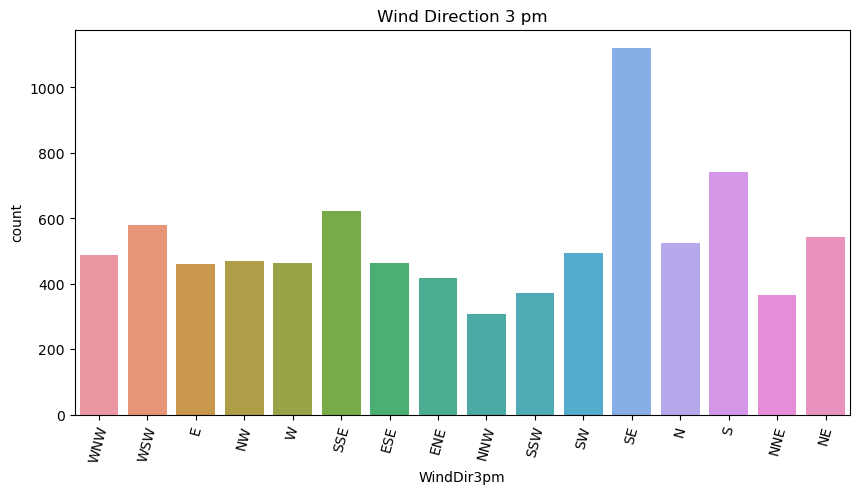

In [124]:
#Visualization of wind at 9 am
plt.figure(figsize=(10,5))
sns.countplot(data["WindDir3pm"])
plt.title("Wind Direction 3 pm")
plt.xticks(rotation=75)
plt.show()


In the plots we can clearly see that the wing direction was towards the SW at 3pm.

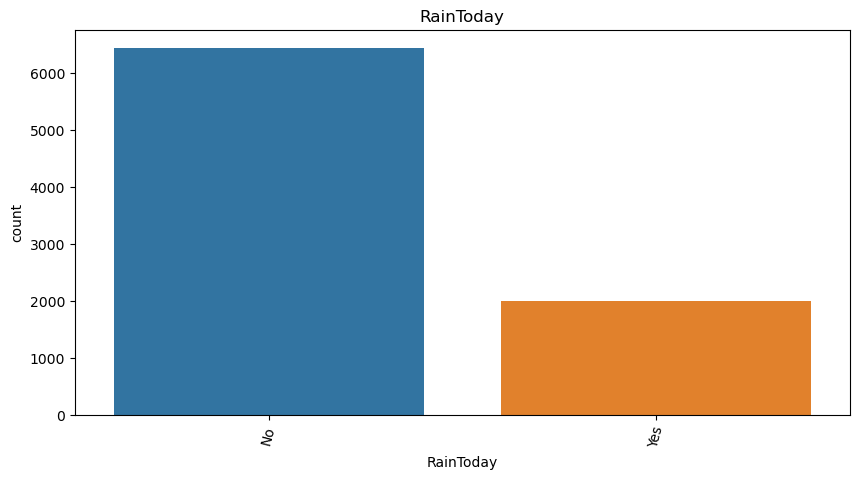

No     6435
Yes    1990
Name: RainToday, dtype: int64

In [125]:
#Visualization of Rain Today
plt.figure(figsize=(10,5))
sns.countplot(data["RainToday"])
plt.title("RainToday")
plt.xticks(rotation=75)
plt.show()
data.RainToday.value_counts()

Yes - 1990

No - 6435

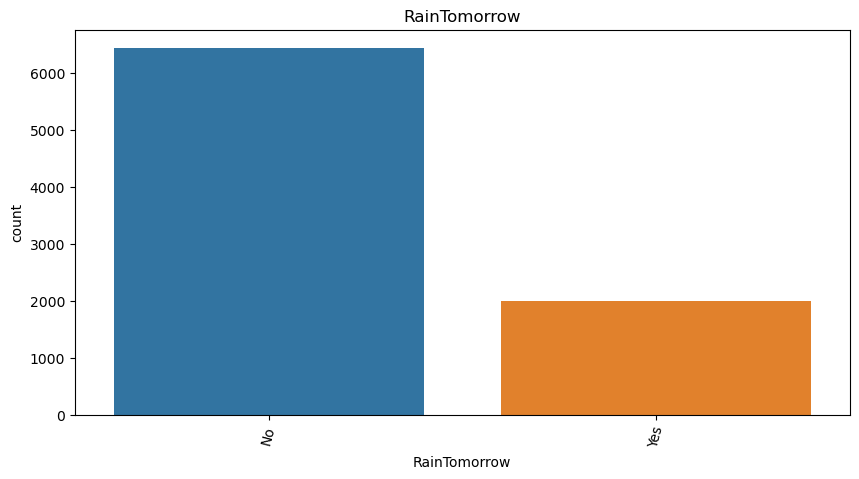

No     6434
Yes    1991
Name: RainTomorrow, dtype: int64

In [126]:
#Lets plot RainTommorow
plt.figure(figsize=(10,5))
sns.countplot(data["RainTomorrow"])
plt.title("RainTomorrow")
plt.xticks(rotation=75)
plt.show()
data.RainTomorrow.value_counts()

No ->6434

Yes -> 1991

Here we can find that RainToday and RainTomorrow is almost Same.

# Lets Plot Numerical Columns

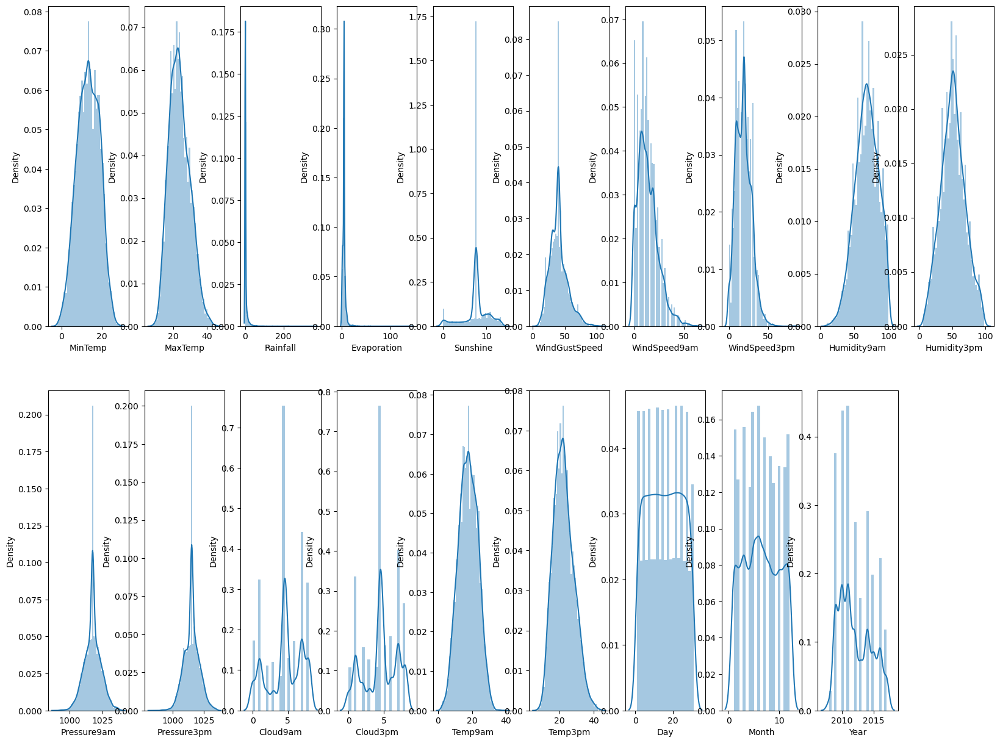

In [127]:
#Lets plot all numerical columns
plt.figure(figsize=(20,15))
plotnumber=1
for col in num_col:
    if plotnumber <=20:
        ax=plt.subplot(2,10,plotnumber)
        sns.distplot(data[col])
        plt.xlabel(col)
    plotnumber +=1
plt.show()

Observation

From the above graph we can not say our dataset is normally distributed.

- Min Temp is normally distributed.
- Max Temp is slightly skewed.
- Rainfall and Evaporation is more skewed.
- Sunshine is not normally distributed.
- WindGustSpeed, WindSpeed9am,WindSpeed3pm is more skewed.
- Humidity9am is slightly skewed and Humidity3pm is normally distributed.
- Pressure9am, Pressure3pm, Cloud9am, Cloud3pm, Temp9am, Temp3pm, Day, Month and Year has no skewness however the data is not distributed uniformly.

# Bivariate Analysis

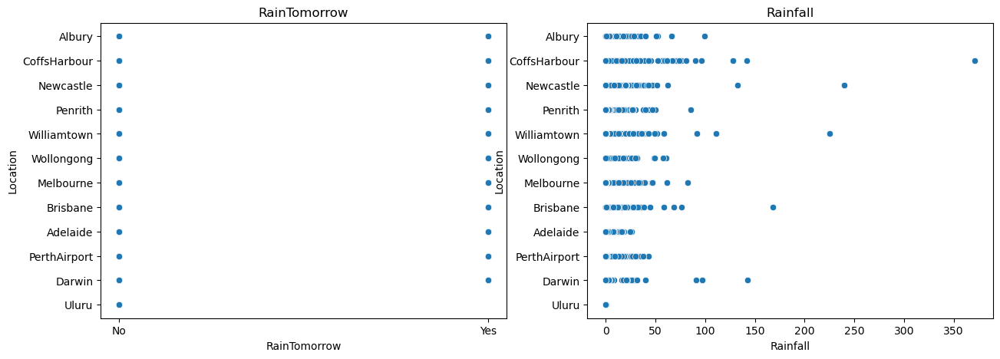

In [128]:
#checking the corelation between location with both the targets (Rainfall and Rain Tommorow)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.title('RainTomorrow')
sns.scatterplot(x='RainTomorrow',y='Location',data=data)
plt.subplot(1,2,2)
plt.title('Rainfall')
sns.scatterplot(x='Rainfall',y='Location',data=data)
plt.show()

We can see that location does not have any major impact on the prediction of rainfall, however we will not drop the feature as prediction is done as per region.

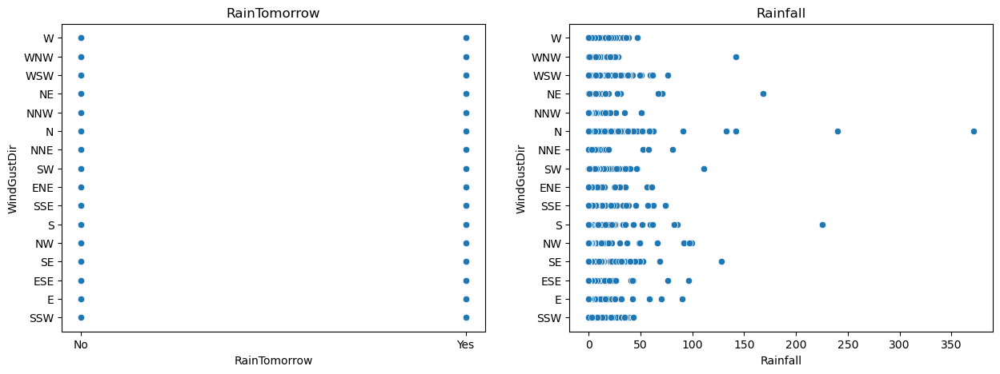

In [129]:
#checking the corelation between WindGustDir with both the targets (Rainfall and Rain Tommorow)
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.title('RainTomorrow')
sns.scatterplot(x='RainTomorrow',y='WindGustDir',data=data)
plt.subplot(1,2,2)
plt.title('Rainfall')
sns.scatterplot(x='Rainfall',y='WindGustDir',data=data)
plt.show()

From this graph we can observe that there is no linear relation of the feature with both the targets

<AxesSubplot:xlabel='WindDir3pm', ylabel='Rainfall'>

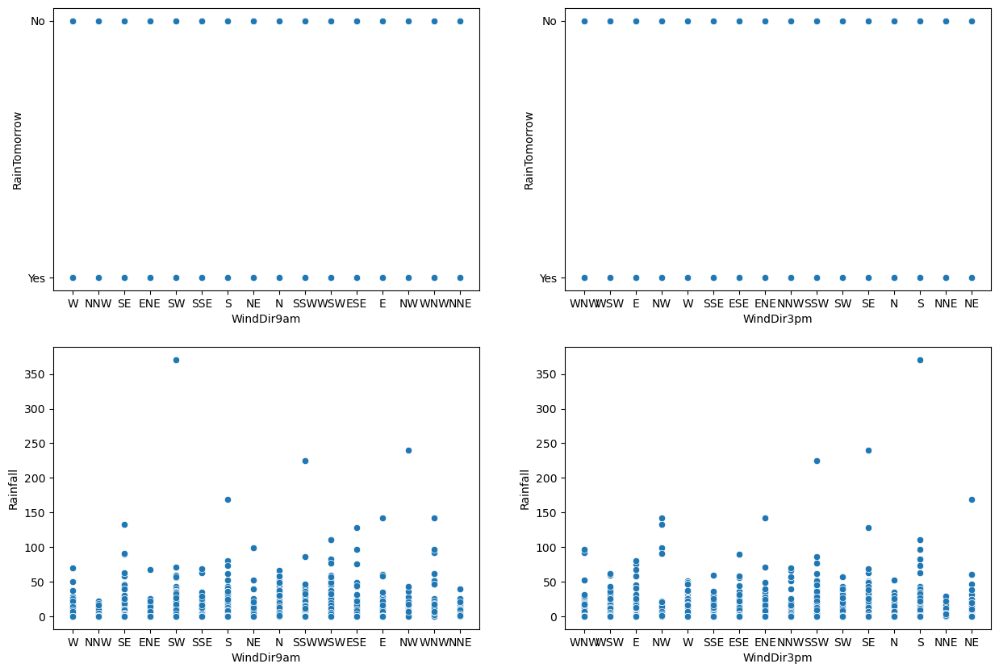

In [130]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between WindDir9am and RainTomorrow
sns.scatterplot(x='WindDir9am',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between WindDir3pm and RainTomorrow
sns.scatterplot(x='WindDir3pm',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between WindDir9am and Rainfall
sns.scatterplot(x='WindDir9am',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between WindDir3pm and Rainfall
sns.scatterplot(x='WindDir3pm',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

We dont find any Relation Between RainFall and WinDir9am ,WindDir3pm

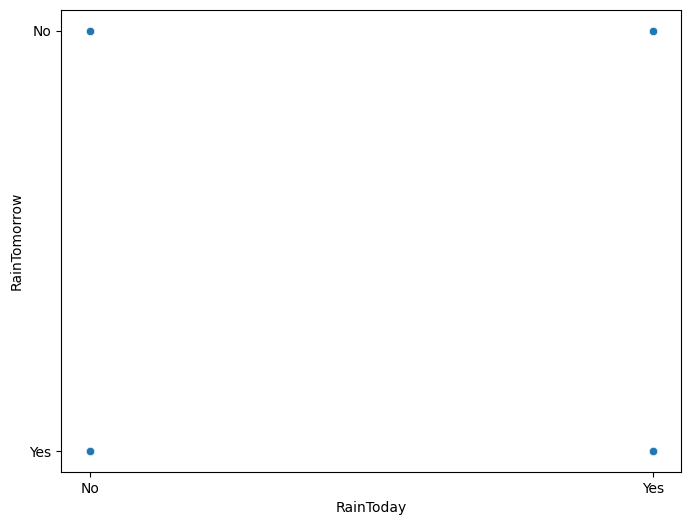

In [131]:
#Checking the relation between Rainfall today and Rainfall Tomorrow
plt.figure(figsize=(8,6))
sns.scatterplot(x=data['RainToday'],y=data['RainTomorrow'])
plt.show()

There is no relation that we can see in the scatter plot.

<AxesSubplot:xlabel='MaxTemp', ylabel='Rainfall'>

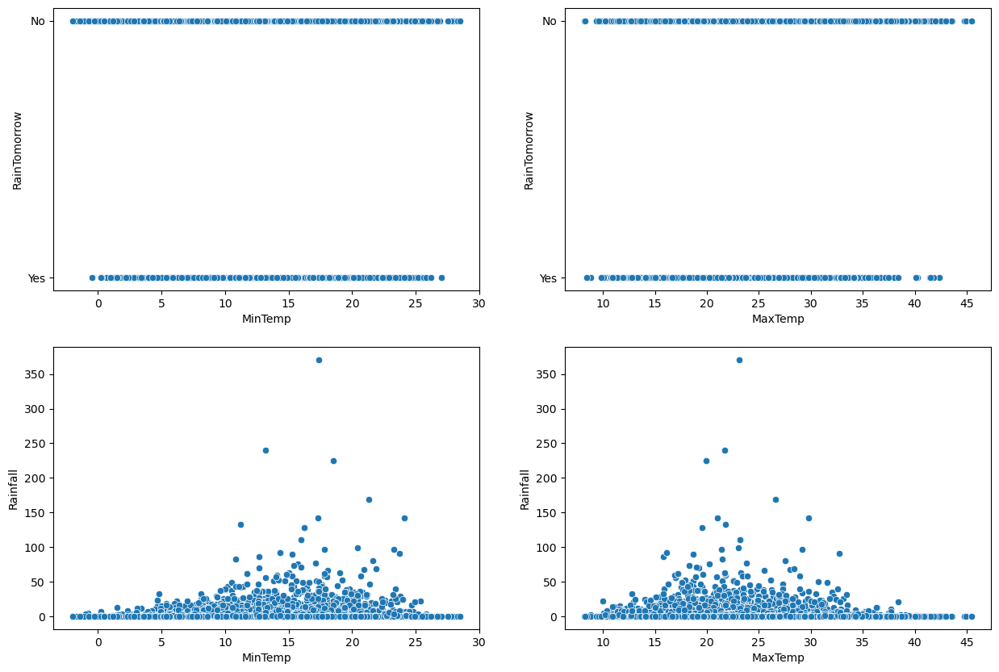

In [132]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between minimum temperature and RainTomorrow
sns.scatterplot(x='MinTemp',y='RainTomorrow',ax=axes[0,0],palette="green",data=data)

#checking the relation between max temperature and RainTomorrow
sns.scatterplot(x='MaxTemp',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between minimum temperature and Rainfall
sns.scatterplot(x='MinTemp',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between max temperature and Rainfall
sns.scatterplot(x='MaxTemp',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observations

We can clearly see from the plotted graphs that there is no linear relation of max temp and min temp with both the targets

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

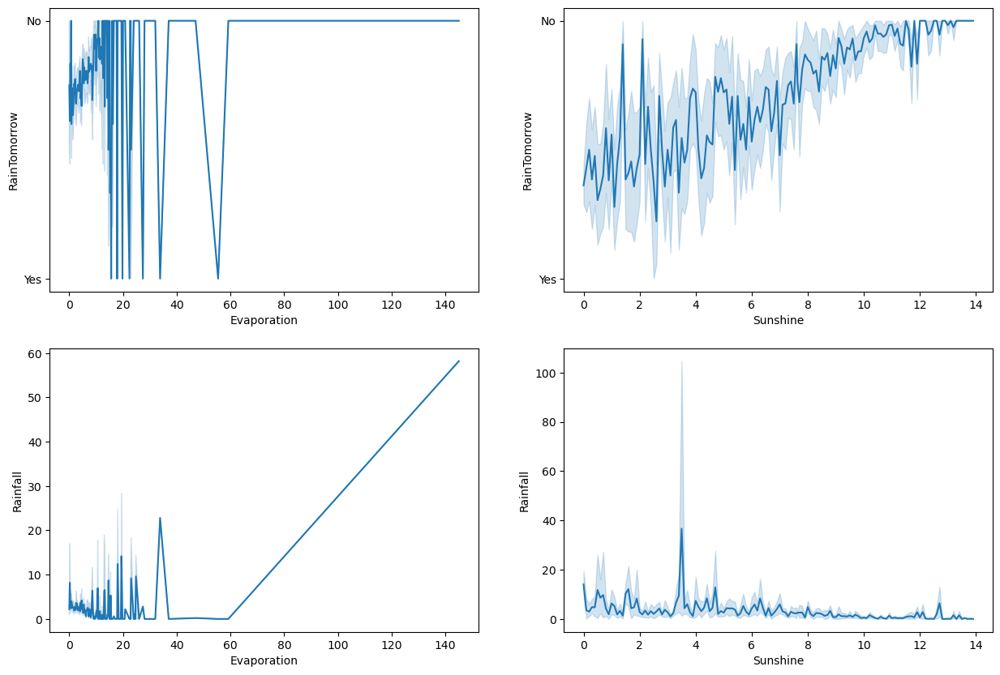

In [133]:
g,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between Evaporation and RainTomorrow
sns.lineplot(x='Evaporation',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between Sunshine and RainTomorrow
sns.lineplot(x='Sunshine',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between Evaporation and Rainfall
sns.lineplot(x='Evaporation',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between Sunshine and Rainfall
sns.lineplot(x='Sunshine',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

Evaporation and RainTommorow have Negative Relation

Sunshine and RainTommorow have positive Relation

Rainfall and Evaporation have Positve Relation

Rainfall and Sunshine the dont have any relation

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

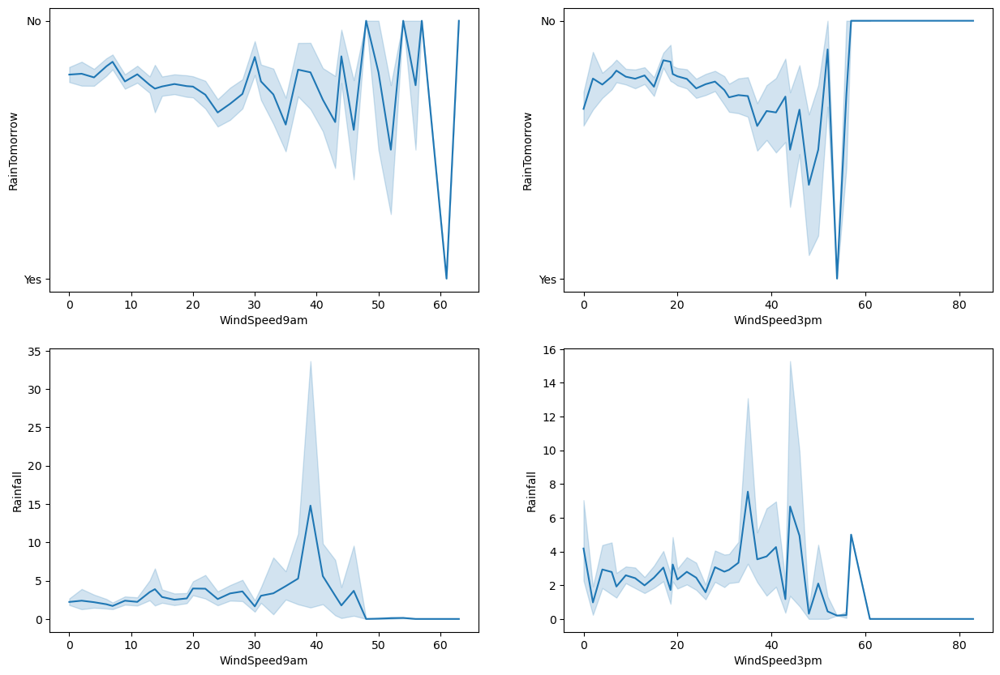

In [134]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between WindSpeed9am and RainTomorrow
sns.lineplot(x='WindSpeed9am',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between WindSpeed3pm and RainTomorrow
sns.lineplot(x='WindSpeed3pm',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between WindSpeed9am and Rainfall
sns.lineplot(x='WindSpeed9am',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between WindSpeed3pm and Rainfall
sns.lineplot(x='WindSpeed3pm',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

We can see that There is no linear relationship between both target

<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

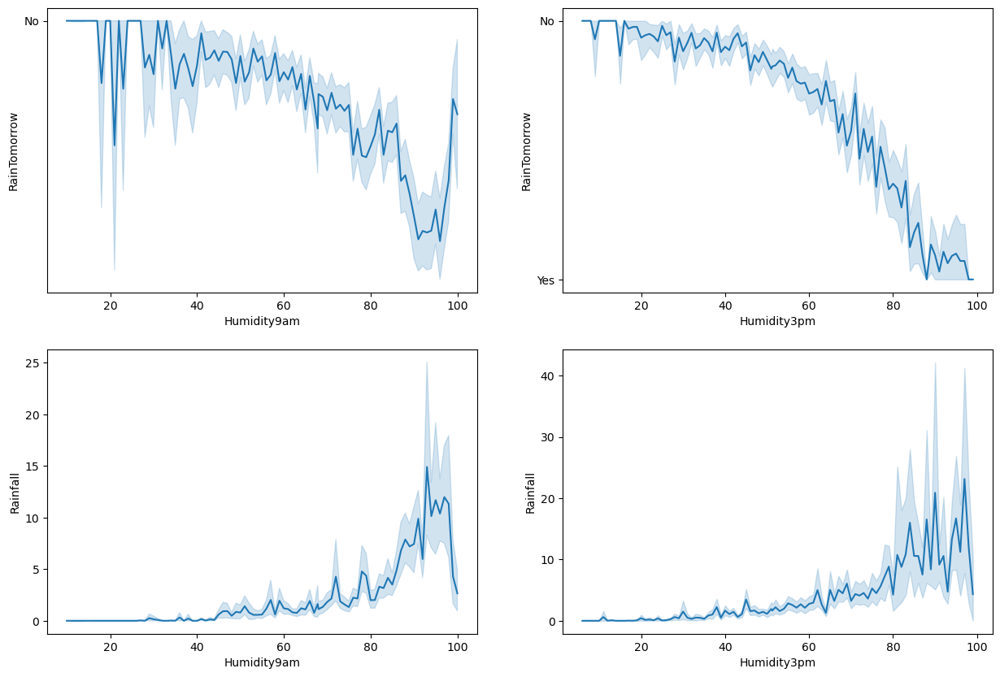

In [135]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between Humidity9am and RainTomorrow
sns.lineplot(x='Humidity9am',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between Humidity3pm and RainTomorrow
sns.lineplot(x='Humidity3pm',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between Humidity9am and Rainfall
sns.lineplot(x='Humidity9am',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between Humidity3pm and Rainfall
sns.lineplot(x='Humidity3pm',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

RainTommorow and Humidity 9AM has Negative Relationship

RainTommorow and Humidity 3PM has Negative Relationship


Rainfall and Humidity 9AM has Some Positive Relationship


Rainfall and Humidity 3PM has Some Postive Relationship

<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

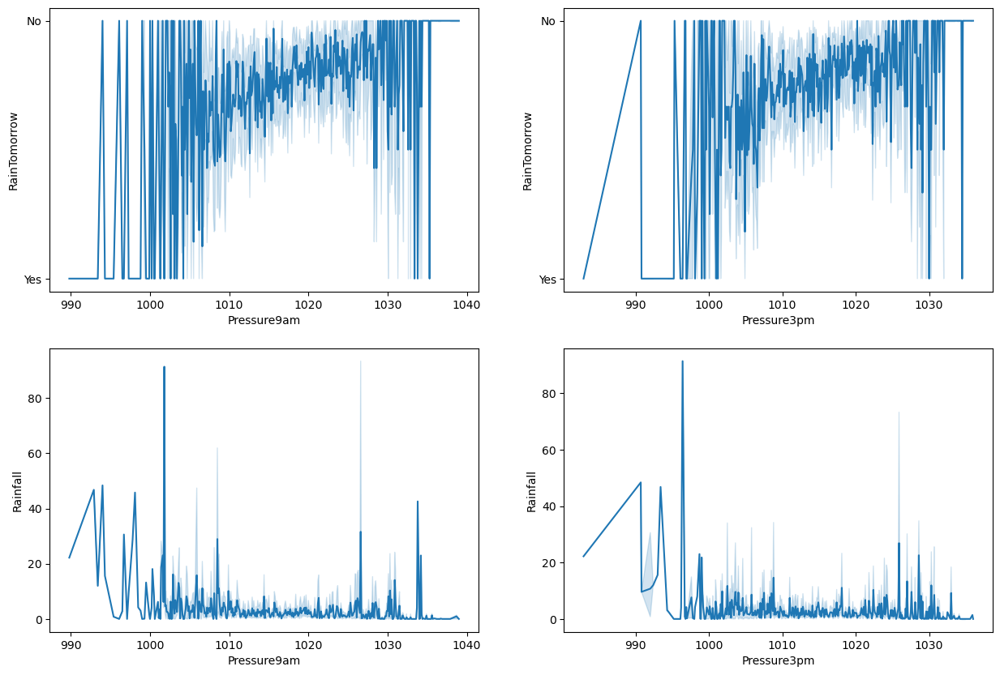

In [136]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between Pressure9am and RainTomorrow
sns.lineplot(x='Pressure9am',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between Pressure3pm and RainTomorrow
sns.lineplot(x='Pressure3pm',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between Pressure9am and Rainfall
sns.lineplot(x='Pressure9am',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between Pressure3pm and Rainfall
sns.lineplot(x='Pressure3pm',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

We can see in the above graph there is no relationship

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

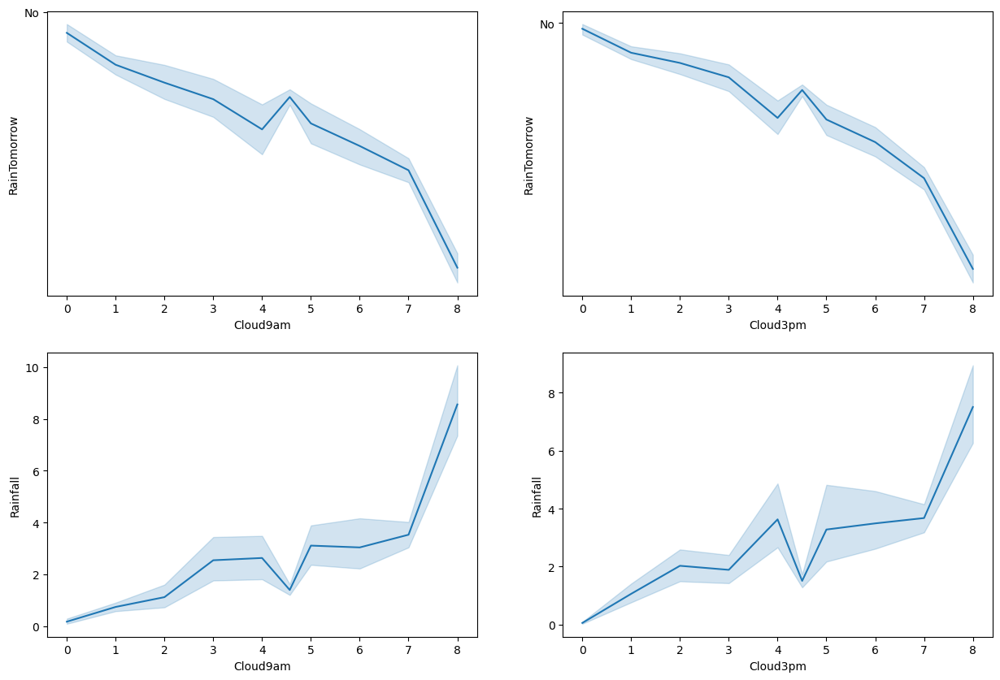

In [137]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between Cloud9am and RainTomorrow
sns.lineplot(x='Cloud9am',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between Cloud3pm and RainTomorrow
sns.lineplot(x='Cloud3pm',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between Cloud9am and Rainfall
sns.lineplot(x='Cloud9am',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between Cloud3pm and Rainfall
sns.lineplot(x='Cloud3pm',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

Raintommorow and Cloud 9AM have Negative Relationship


Raintommorow and Cloud 3PM have Negative Relationship



Rainfall and Cloud 9AM have some positive relationship


Rainfall and Cloud 3PM have somee Positive Relationship

<AxesSubplot:xlabel='Temp3pm', ylabel='Rainfall'>

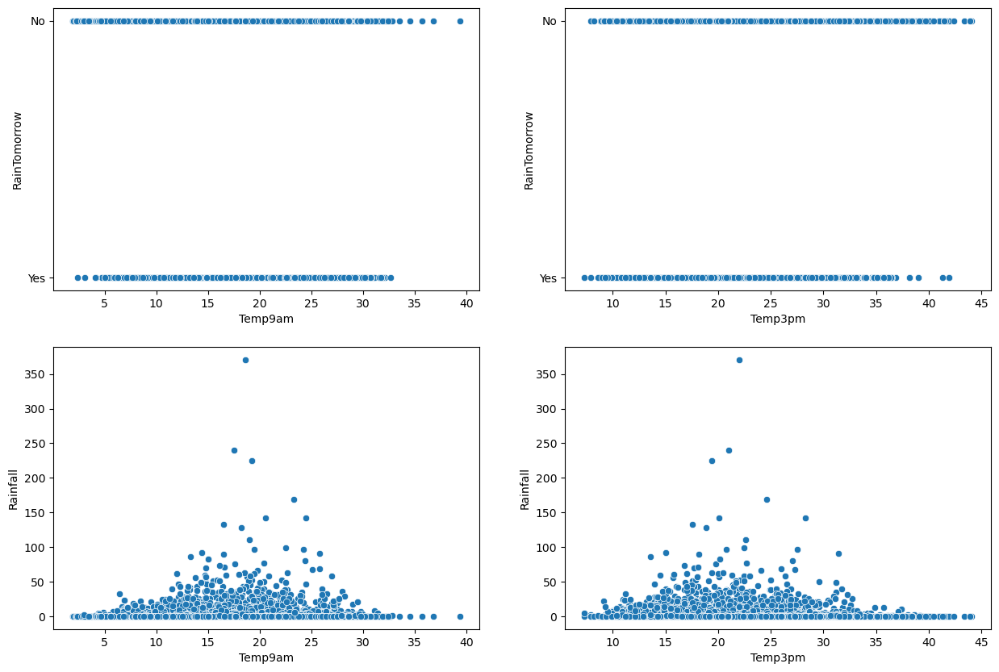

In [138]:
fig,axes=plt.subplots(2,2,figsize=(15,10))

#checking the relation between Temp9am and RainTomorrow
sns.scatterplot(x='Temp9am',y='RainTomorrow',ax=axes[0,0],palette="OrRd",data=data)

#checking the relation between Temp3pm and RainTomorrow
sns.scatterplot(x='Temp3pm',y='RainTomorrow',ax=axes[0,1],palette="OrRd",data=data)

#checking the relation between Temp9am and Rainfall
sns.scatterplot(x='Temp9am',y='Rainfall',ax=axes[1,0],palette="OrRd",data=data)

#checking the relation between Temp3pm and Rainfall
sns.scatterplot(x='Temp3pm',y='Rainfall',ax=axes[1,1],palette="OrRd",data=data)

Observation

We can clearly see that there is no relationship in both of the Target.

<AxesSubplot:xlabel='Year', ylabel='Rainfall'>

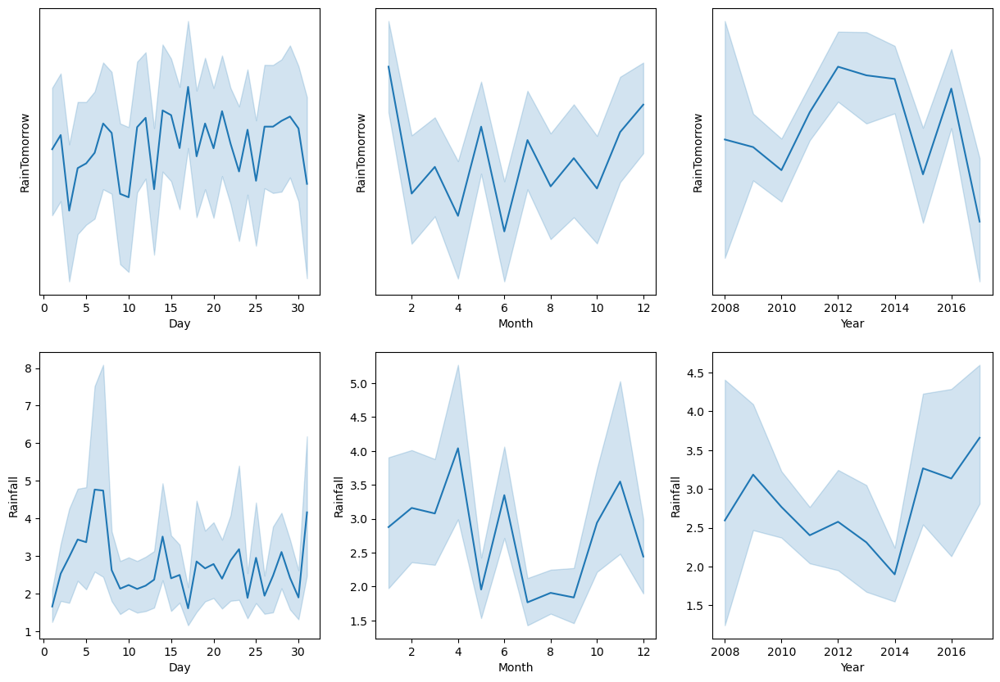

In [139]:
fig,axes=plt.subplots(2,3,figsize=(15,10))

#checking the relation between Day and RainTomorrow
sns.lineplot(x='Day',y='RainTomorrow',ax=axes[0,0],palette="green",data=data)

#checking the relation between Month and RainTomorrow
sns.lineplot(x='Month',y='RainTomorrow',ax=axes[0,1],palette="green",data=data)

#checking the relation between Year and RainTomorrow
sns.lineplot(x='Year',y='RainTomorrow',ax=axes[0,2],palette="green",data=data)

#checking the relation between Day and Rainfall
sns.lineplot(x='Day',y='Rainfall',ax=axes[1,0],palette="purple",data=data)

#checking the relation between Month and Rainfall
sns.lineplot(x='Month',y='Rainfall',ax=axes[1,1],palette="purple",data=data)

#checking the relation between Year and Rainfall
sns.lineplot(x='Year',y='Rainfall',ax=axes[1,2],palette="purple",data=data)

# MultiVariate Analysis

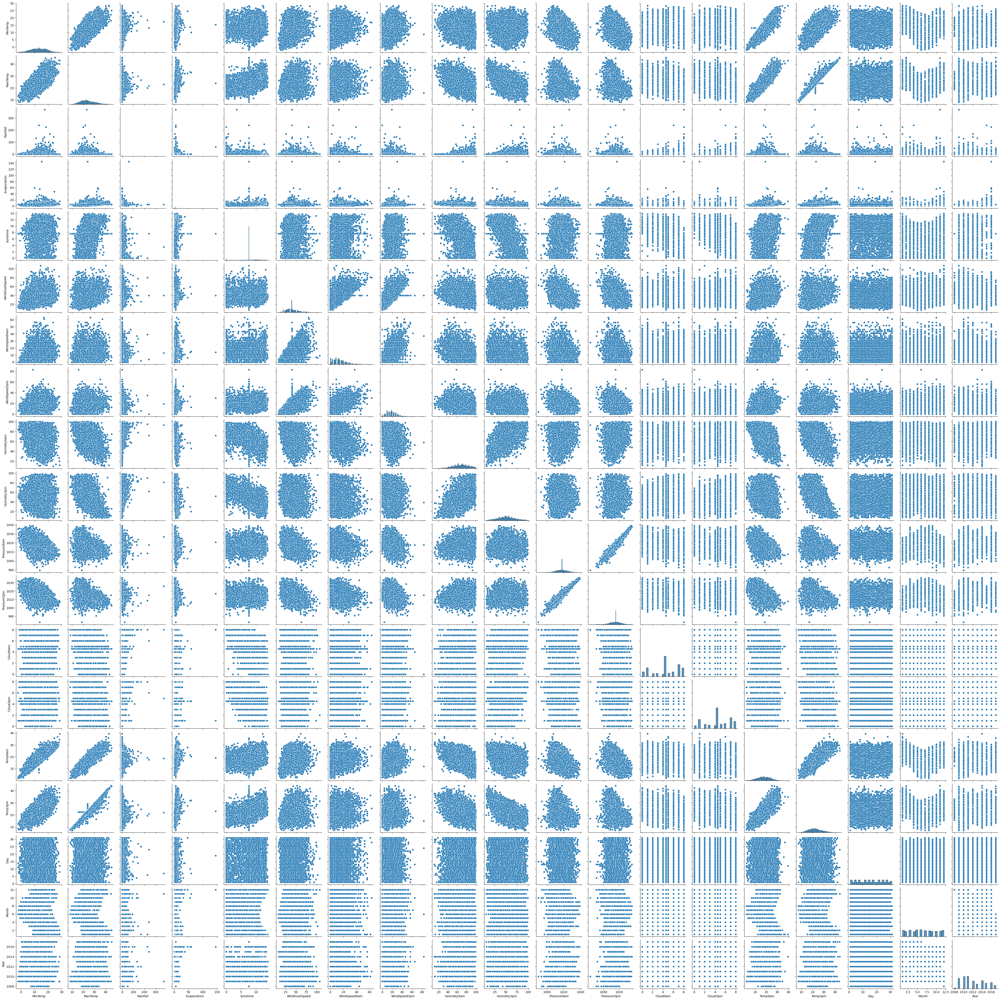

In [140]:
sns.pairplot(data)

# Identifying the Outliers

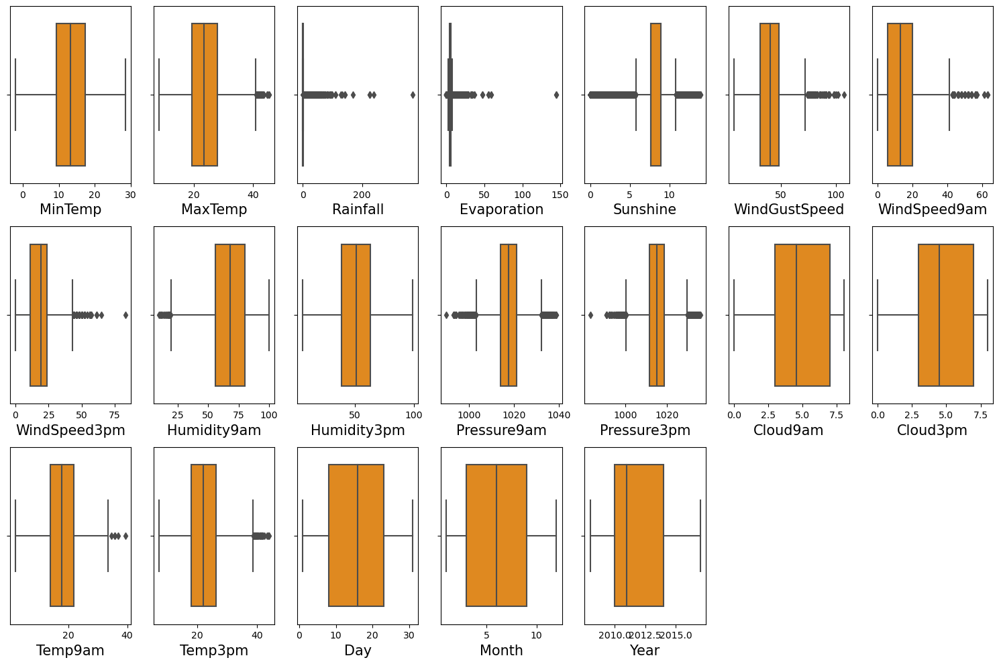

In [141]:
# Identifying the outliers using boxplot
plt.figure(figsize=(15,10),facecolor='white')
plotnumber=1
for column in num_col:
    if plotnumber<=20:
        ax=plt.subplot(3,7,plotnumber)
        sns.boxplot(data[column],color="darkorange")
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.tight_layout()

From the above boxplots, we can see that features having outliers are: MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am, Windspeed3pm, Humidity9am, Pressure9am, Pressure3pm, Temp9am, Temp3pm.

Lets remove the outliers using zscore method

# Removing Outliers

In [142]:
from scipy.stats import zscore
feature = data[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

z=np.abs(zscore(feature))
# Creating new dataframe
new_df = data[(z<3).all(axis=1)] 
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


In [143]:
data.shape

(8425, 25)

In [144]:
new_df.shape

(7987, 25)

This is the new dataframe after removing the outliers. Here we have removed the outliers whose Zscore is less than 3

In [145]:
#Percentage data loss:
loss_percent=(8425-7987)/8425*100
print(loss_percent,'%')

5.198813056379822 %


After Removing Outliers we remove 5% of the data.

# ii) IQR (Inter Quantile Range) method

In [146]:
# 1st quantile
Q1=feature.quantile(0.25)

# 3rd quantile
Q3=feature.quantile(0.75)

# IQR
IQR=Q3 - Q1

df1=data[~((data < (Q1 - 1.5 * IQR)) |(data > (Q3 + 1.5 * IQR))).any(axis=1)]

In [147]:
df1.shape

(4054, 25)

In [148]:
# Checking the the data loss
data_loss = (8425-4054)/8425*100
data_loss

51.8813056379822

So, Here we removed more then 50% data . its not good for model. lets move foreward with Z Score Method

# Checking the skewness of the dataset

In [149]:
new_df.skew().sort_values()

Sunshine        -0.723970
Cloud9am        -0.356892
Cloud3pm        -0.266829
Humidity9am     -0.231656
MinTemp         -0.084549
Temp9am         -0.038035
Day              0.002731
Pressure9am      0.020735
Pressure3pm      0.044876
Month            0.054460
Humidity3pm      0.125150
WindSpeed3pm     0.300109
MaxTemp          0.314510
Temp3pm          0.334170
Year             0.430100
WindGustSpeed    0.506897
WindSpeed9am     0.711395
Evaporation      0.846181
Rainfall         3.519090
dtype: float64

Here we set threshold for += 0.5 .

There Columns have Skewness

'MinTemp',

'MaxTemp'

'Rainfall'

'Evaporation'

'Sunshine'

'WindSpeed9am'

'WindSpeed3pm'

'Humidity9am'

'Humidity3pm'

'Pressure9am'

'Pressure3pm'

'Temp9am'

'Day'

'Month'

'Year'

# Encoding the categorical columns

In [150]:
from sklearn.preprocessing import LabelEncoder

In [151]:
# le=LabelEncoder()
new_df[cat_col]= new_df[cat_col].apply(le.fit_transform)
new_df

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,6,2017
8421,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,6,2017
8422,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,6,2017
8423,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,6,2017


# Lets Check Correlation

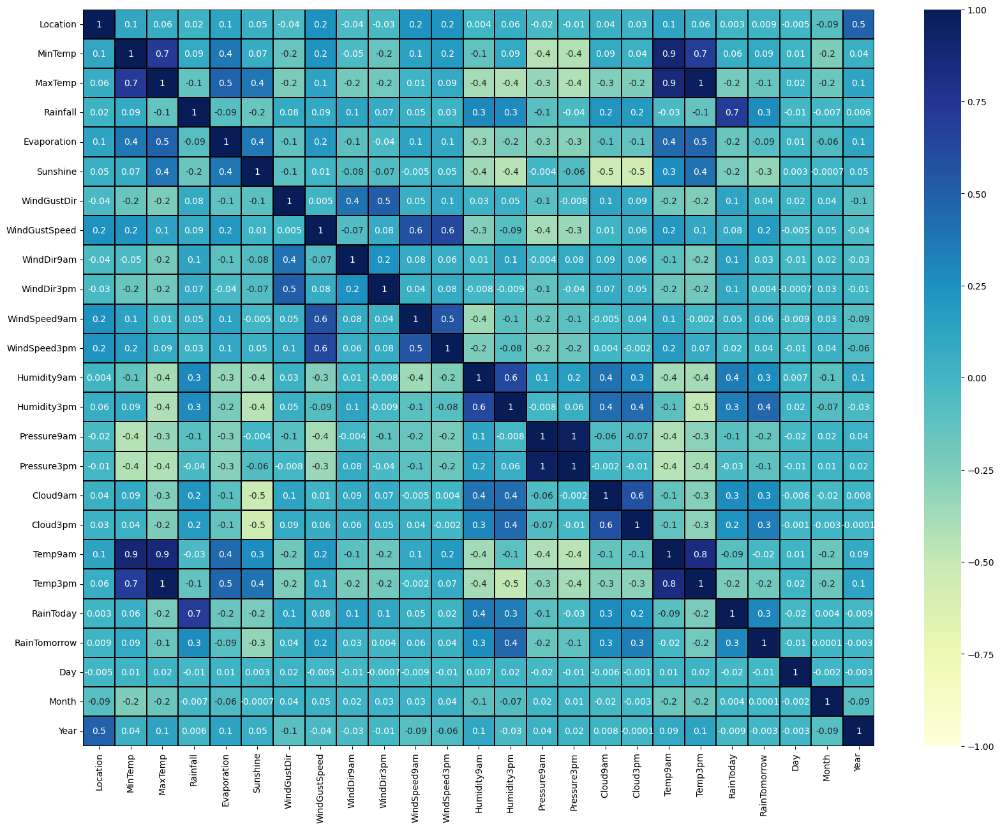

In [152]:
plt.figure(figsize=(20,15))    
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1,fmt='.1g',linecolor="black",annot=True,annot_kws={'size':10},cmap="YlGnBu")
plt.yticks(rotation=0);

Observation


MinTemp and Temp9AM -> 90% Relation



MinTemp and MaxTemp Have 70% Relation



MaxTemp and Temp9AM have 90% Relation



RainFall and RainToday 70% Relation


They might have created MultiCollinearity

In [153]:
cor =new_df.corr()
cor

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
Location,1.000000,0.116694,0.063798,0.017936,0.132245,0.048579,-0.037707,0.245658,-0.041030,-0.031195,0.238424,0.231939,0.003725,0.059978,-0.024265,-0.012288,0.041859,0.027050,0.118100,0.060707,0.002934,0.009222,-0.004978,-0.086011,0.481143
MinTemp,0.116694,1.000000,0.718598,0.088980,0.372576,0.065682,-0.154935,0.231097,-0.045231,-0.154184,0.144125,0.185976,-0.126383,0.090208,-0.433113,-0.427936,0.089354,0.036649,0.888690,0.687570,0.061728,0.091021,0.010924,-0.247066,0.040001
MaxTemp,0.063798,0.718598,1.000000,-0.138506,0.468786,0.387050,-0.237955,0.136337,-0.217160,-0.190417,0.012153,0.093241,-0.382687,-0.409560,-0.333569,-0.414358,-0.252579,-0.248268,0.864864,0.974957,-0.219747,-0.149708,0.017068,-0.164351,0.120204
Rainfall,0.017936,0.088980,-0.138506,1.000000,-0.092388,-0.161877,0.081196,0.088198,0.121580,0.074577,0.051753,0.030343,0.294276,0.288959,-0.098433,-0.039030,0.220778,0.187137,-0.033526,-0.146589,0.697522,0.267970,-0.013772,-0.007054,0.005928
Evaporation,0.132245,0.372576,0.468786,-0.092388,1.000000,0.369080,-0.121384,0.200769,-0.115309,-0.036752,0.140171,0.105313,-0.325325,-0.231465,-0.262043,-0.275720,-0.116113,-0.146421,0.439628,0.454352,-0.163847,-0.089365,0.011560,-0.055232,0.124246
Sunshine,0.048579,0.065682,0.387050,-0.161877,0.369080,1.000000,-0.104739,0.009797,-0.076595,-0.069789,-0.004618,0.046531,-0.366337,-0.437504,-0.004078,-0.063832,-0.527350,-0.541996,0.261680,0.403489,-0.219089,-0.317675,0.003451,-0.000727,0.054960
WindGustDir,-0.037707,-0.154935,-0.237955,0.081196,-0.121384,-0.104739,1.000000,0.005465,0.405681,0.507292,0.048025,0.108357,0.031081,0.051061,-0.095047,-0.008263,0.123415,0.093527,-0.185080,-0.249791,0.121709,0.044378,0.017003,0.038044,-0.096042
WindGustSpeed,0.245658,0.231097,0.136337,0.088198,0.200769,0.009797,0.005465,1.000000,-0.069460,0.076737,0.577553,0.628452,-0.263933,-0.085009,-0.377284,-0.336132,0.013678,0.064375,0.198936,0.101786,0.076677,0.181478,-0.005232,0.045638,-0.035546
WindDir9am,-0.041030,-0.045231,-0.217160,0.121580,-0.115309,-0.076595,0.405681,-0.069460,1.000000,0.243622,0.081838,0.058887,0.009571,0.117910,-0.003943,0.081400,0.092396,0.062637,-0.101576,-0.224390,0.149239,0.027091,-0.010014,0.018344,-0.034468
WindDir3pm,-0.031195,-0.154184,-0.190417,0.074577,-0.036752,-0.069789,0.507292,0.076737,0.243622,1.000000,0.040160,0.079716,-0.007820,-0.009385,-0.129842,-0.037280,0.073742,0.054321,-0.172000,-0.202000,0.100983,0.003674,-0.000714,0.028629,-0.010781


In [154]:
cor['RainTomorrow'].sort_values(ascending=False)

RainTomorrow     1.000000
Humidity3pm      0.445891
Cloud3pm         0.337922
RainToday        0.294528
Humidity9am      0.269722
Cloud9am         0.269598
Rainfall         0.267970
WindGustSpeed    0.181478
MinTemp          0.091021
WindSpeed9am     0.057933
WindGustDir      0.044378
WindSpeed3pm     0.042472
WindDir9am       0.027091
Location         0.009222
WindDir3pm       0.003674
Month            0.000135
Year            -0.003180
Day             -0.012493
Temp9am         -0.021459
Evaporation     -0.089365
Pressure3pm     -0.124953
MaxTemp         -0.149708
Pressure9am     -0.152692
Temp3pm         -0.191706
Sunshine        -0.317675
Name: RainTomorrow, dtype: float64

Here we can clearly see that humidy has the highest correlation with RainTomorrow and sun shine has the lowest correlation.

In [155]:
cor['Rainfall'].sort_values(ascending=False)

Rainfall         1.000000
RainToday        0.697522
Humidity9am      0.294276
Humidity3pm      0.288959
RainTomorrow     0.267970
Cloud9am         0.220778
Cloud3pm         0.187137
WindDir9am       0.121580
MinTemp          0.088980
WindGustSpeed    0.088198
WindGustDir      0.081196
WindDir3pm       0.074577
WindSpeed9am     0.051753
WindSpeed3pm     0.030343
Location         0.017936
Year             0.005928
Month           -0.007054
Day             -0.013772
Temp9am         -0.033526
Pressure3pm     -0.039030
Evaporation     -0.092388
Pressure9am     -0.098433
MaxTemp         -0.138506
Temp3pm         -0.146589
Sunshine        -0.161877
Name: Rainfall, dtype: float64

Here we can clearly see that RainToday has highest relation with Rainfall and sunshine has least correlation with Rainfall.

# Visualizing the correlation between label and features using bar plot

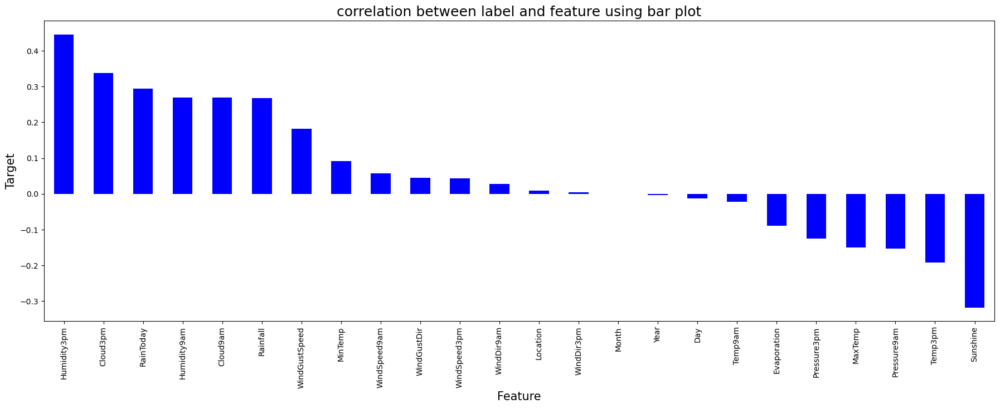

In [156]:
plt.figure(figsize=(22,7))
new_df.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='blue')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title('correlation between label and feature using bar plot',fontsize=18)
plt.show()

Observation


Maximum Correlation -> Humidity3PM, Cloud3PM,RainToday,Cloud9AM,Humidity9AM,Rainfall,Windspeed


Norelation -> WindSpeed3PM ,Location , Windir3PM , Day ,Month ,Year



We dont have to delete this because Location Day Month Year is imp for RainPrediction.

# Prediction for Rain-Tomorrow

In [157]:
#Lets separate x and y
x=new_df.drop(columns='RainTomorrow')

In [158]:
y=new_df['RainTomorrow']

In [159]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [160]:
vif = pd.DataFrame()
vif["Features"] = x.columns
vif['vif'] = [variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif

,Features,vif
0,Location,5.027224
1,MinTemp,59.613484
2,MaxTemp,440.617165
3,Rainfall,2.293289
4,Evaporation,9.135230
5,Sunshine,16.481786
6,WindGustDir,5.361645
7,WindGustSpeed,24.154910
8,WindDir9am,4.733064
9,WindDir3pm,6.113400


Here we set threshold for VIF is 10 .. So Which Columns not come in range We are going to delete this.

In [162]:
x.drop(columns=['Pressure9am','Pressure3pm','Temp9am'],inplace=True)

# Selecting Kbest Features

In [163]:
from sklearn.feature_selection import SelectKBest, f_classif

In [164]:
bestfeat = SelectKBest(score_func = f_classif, k = 'all')
fit = bestfeat.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

In [165]:
fit = bestfeat.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(35,'Score'))

          Feature        Score
13    Humidity3pm  1981.530539
15       Cloud3pm  1029.364731
5        Sunshine   896.276633
17      RainToday   758.469769
12    Humidity9am   626.486365
14       Cloud9am   625.864340
3        Rainfall   617.745142
16        Temp3pm   304.653895
7   WindGustSpeed   271.937255
2         MaxTemp   183.065685
1         MinTemp    66.707542
4     Evaporation    64.282695
10   WindSpeed9am    26.889499
6     WindGustDir    15.756523
11   WindSpeed3pm    14.429616
8      WindDir9am     5.864766
18            Day     1.246468
0        Location     0.679184
9      WindDir3pm     0.107778
20           Year     0.080770
19          Month     0.000146


Here we have find with less relation Year , Moth , Day and Location. But we are not decided to delete this . Because all the features are imp for prediction.

# Lets Remove Skewness

In [166]:
from sklearn.preprocessing import PowerTransformer

In [167]:
scaler = PowerTransformer()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Cloud9am,Cloud3pm,Temp3pm,RainToday,Day,Month,Year
0,-1.568421,0.060502,-0.075727,0.773058,0.186311,-0.097439,1.160422,0.433926,1.180892,1.354048,0.784361,0.670390,0.152197,-1.678848,1.461692,-0.000987,-0.027061,-0.542476,-1.885612,1.524023,-2.433609e-13
1,-1.568421,-1.057253,0.287145,-0.654231,0.186311,-0.097439,1.320123,0.433926,-0.145662,1.558466,-0.983463,0.472699,-1.429214,-1.491664,-0.013271,-0.000987,0.392529,-0.542476,-1.703131,1.524023,-2.433609e-13
2,-1.568421,-0.032222,0.383000,-0.654231,0.186311,-0.097439,1.475632,0.579399,1.180892,1.558466,0.700314,0.863753,-1.749610,-1.187424,-0.013271,-1.082152,0.210969,-0.542476,-1.536664,1.524023,-2.433609e-13
3,-1.568421,-0.720632,0.739293,-0.654231,0.186311,-0.097439,-0.579731,-1.257142,0.469967,-1.875412,-0.063397,-0.966158,-1.374578,-2.066341,-0.013271,-0.000987,0.742575,-0.542476,-1.381174,1.524023,-2.433609e-13
4,-1.568421,0.818594,1.363746,1.135607,0.186311,-0.097439,1.160422,0.209370,-1.524916,-0.141138,-0.541317,0.270193,0.851199,-1.008868,1.025084,1.559044,1.224291,-0.542476,-1.233906,1.524023,-2.433609e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7982,1.016329,-1.925180,0.008394,-0.654231,0.186311,-0.097439,-1.838176,-0.605532,0.469967,-1.591859,0.146229,-0.720808,-1.039830,-1.553637,-0.013271,-0.000987,0.075946,-0.542476,0.636015,-0.046718,2.916556e-13
7983,1.016329,-1.773180,0.319237,-0.654231,0.186311,-0.097439,-0.124576,-1.460065,0.469967,-1.076782,0.146229,-0.966158,-0.752302,-1.742128,-0.013271,-0.000987,0.425052,-0.542476,0.736703,-0.046718,2.916556e-13
7984,1.016329,-1.432995,0.571023,-0.654231,0.186311,-0.097439,-0.834587,-0.103212,0.469967,1.354048,-0.290718,-0.966158,-0.925720,-1.553637,-0.013271,-0.000987,0.680153,-0.542476,0.836217,-0.046718,2.916556e-13
7985,1.016329,-0.982334,0.586478,-0.654231,0.186311,-0.097439,0.469851,-0.874832,0.657373,-1.076782,0.146229,-1.225561,-1.039830,-1.553637,-0.658943,-1.082152,0.664465,-0.542476,0.934619,-0.046718,2.916556e-13


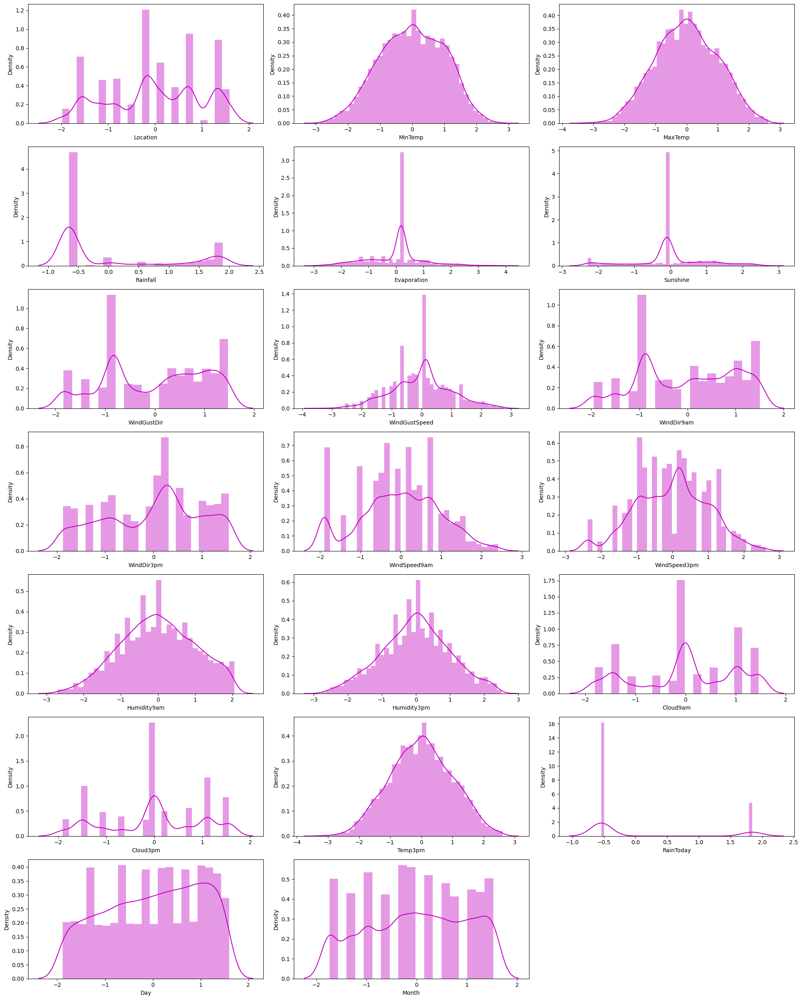

In [168]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in x:
    if plotnumber<=20:
        ax=plt.subplot(7,3,plotnumber)
        sns.distplot(x[column],color="m")
        plt.xlabel(column,fontsize=10)
        plt.yticks(rotation=0,fontsize=10)
    plotnumber+=1
plt.tight_layout()

Observation

Here we can see that we remove most of the skewness..

# SMOTE

In [169]:
y.value_counts()

0    6165
1    1822
Name: RainTomorrow, dtype: int64

We can see that there is a significant difference in the classes hence lets fix this using SMOTE to avoid any bias

In [170]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [171]:
y.value_counts()

0    6165
1    6165
Name: RainTomorrow, dtype: int64

In [172]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression

# LogisticRegression

In [176]:
#Lets make one fucntion to check accuracy again and again
def metrics_score(clf,x_train,x_test,y_train,y_test,train=True):
    if train:
        y_pred=clf.predict(x_train)
        print("======================Training Score===================")
        print("Accuracy Score  ==> ",accuracy_score(y_train,y_pred))
    elif train==False:
        pred=clf.predict(x_test)
        print("======================Testing Score====================")
        print("Accuracy Score==>  ",accuracy_score(y_test,pred))
        print("Classification Report==> ",classification_report(y_test,pred))
        print("Confusion Matrix==> ",confusion_matrix(y_test,pred))
        cv_score = (cross_val_score(clf, x, y, cv=5).mean())*100
        print("Cross Validation Score:", cv_score)

In [175]:
# finding Best Random state
maxAccu=0
maxRS=0

for i in range(1, 1000):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    accuracy = accuracy_score(y_test, pred)
    
    if accuracy>maxAccu:
        maxAccu=accuracy
        maxRS=i

print("Best Accuracy score is", maxAccu,"on Random State", maxRS)

Best Accuracy score is 0.791970802919708 on Random State 596


In [177]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=596)

In [178]:
lr.fit(x_train,y_train)

LogisticRegression()

In [179]:
metrics_score(lr,x_train,x_test,y_train,y_test,train=True)
metrics_score(lr,x_train,x_test,y_train,y_test,train=False)

======================Training Score===================
Accuracy Score  ==>  0.764801297648013
======================Testing Score====================
Accuracy Score==>   0.791970802919708
Classification Report==>                precision    recall  f1-score   support

           0       0.79      0.80      0.80      1248
           1       0.80      0.78      0.79      1218

    accuracy                           0.79      2466
   macro avg       0.79      0.79      0.79      2466
weighted avg       0.79      0.79      0.79      2466

Confusion Matrix==>  [[1004  244]
 [ 269  949]]
Cross Validation Score: 71.71938361719383


# Hyperparameter Tuning

In [180]:
from sklearn.model_selection import GridSearchCV

In [181]:
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-4, 4, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

In [182]:
clf = GridSearchCV(lr, param_grid = param_grid, cv = 3, verbose=True, n_jobs=-1)

In [183]:
best_clf = clf.fit(x,y)

Fitting 3 folds for each of 1600 candidates, totalling 4800 fits


In [184]:
best_clf.best_estimator_

LogisticRegression(C=0.0018329807108324356, penalty='l1', solver='saga')

In [185]:
css=LogisticRegression(C=0.0018329807108324356, solver='liblinear')

In [186]:
css.fit(x_train,y_train)

LogisticRegression(C=0.0018329807108324356, solver='liblinear')

In [187]:
metrics_score(css,x_train,x_test,y_train,y_test,train=True)
metrics_score(css,x_train,x_test,y_train,y_test,train=False)

======================Training Score===================
Accuracy Score  ==>  0.760036496350365
======================Testing Score====================
Accuracy Score==>   0.7834549878345499
Classification Report==>                precision    recall  f1-score   support

           0       0.79      0.77      0.78      1248
           1       0.77      0.80      0.78      1218

    accuracy                           0.78      2466
   macro avg       0.78      0.78      0.78      2466
weighted avg       0.78      0.78      0.78      2466

Confusion Matrix==>  [[963 285]
 [249 969]]
Cross Validation Score: 72.1492295214923


In [188]:
from sklearn.metrics import roc_curve, auc

In [189]:
#predicting the data
y_pred_cnb = css.predict(x_test)
y_prob_pred_cnb = css.predict_proba(x_test)

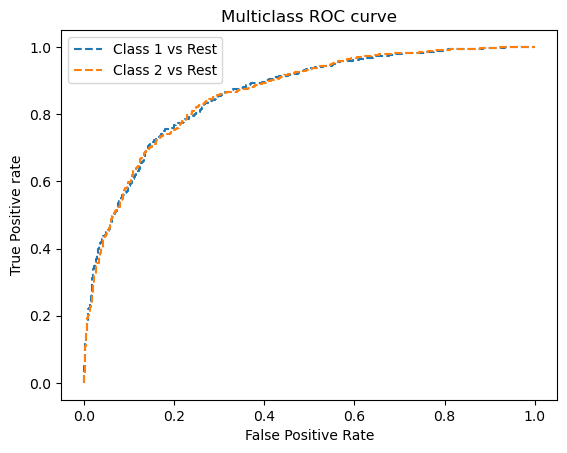

In [190]:
# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 2

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, y_prob_pred_cnb[:,i], pos_label=i)
    
# plotting    
plt.plot(fpr[0], tpr[0], linestyle='--', label='Class 1 vs Rest')
plt.plot(fpr[1], tpr[1], linestyle='--', label='Class 2 vs Rest')


plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive rate')
plt.legend(loc='best')
plt.show()

In [195]:
import pickle
filename=("Pranathi Linear and Logistic Project  (3.0)(Logistic Regression)")
pickle.dump(css,open(filename,'wb'))

# Conclusion

In [196]:
loaded_model=pickle.load(open('Pranathi Linear and Logistic Project  (3.0)(Logistic Regression)','rb'))
result=css.score(x_test,y_test)
print(result*100)

78.34549878345499


In [199]:
conclusion=pd.DataFrame([loaded_model.predict(x_test)[:],y_pred_cnb[:]],index=['Predicted','Original'])
conclusion

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# Linear Regression

# Model Building For Predicting Rainfall (Regression)

In [242]:
new_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.6,5.389395,7.632205,13,44.0,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.0,5.389395,7.632205,14,44.0,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.0,5.389395,7.632205,15,46.0,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.0,5.389395,7.632205,4,24.0,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,1.0,5.389395,7.632205,13,41.0,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


In [250]:
#Dividing data in feature and Label
new_df['Rainfall'].value_counts()

0.0     5303
0.2      390
0.4      176
0.6      115
1.2       82
        ... 
28.0       1
29.4       1
29.8       1
32.8       1
26.8       1
Name: Rainfall, Length: 170, dtype: int64

In [251]:
x = new_df.drop(columns=['Rainfall'],axis=1)
y = new_df['Rainfall']

In [252]:
#Lets import standardscaler
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x)
x_scaled

array([[-1.50842735,  0.05644354, -0.14573194, ..., -1.6716567 ,
         1.63411265, -1.66131549],
       [-1.50842735, -1.05847646,  0.22067594, ..., -1.55797642,
         1.63411265, -1.66131549],
       [-1.50842735, -0.03646646,  0.32060536, ..., -1.44429613,
         1.63411265, -1.66131549],
       ...,
       [ 1.02942282, -1.43011646,  0.5204642 , ...,  0.82930956,
        -0.12372583,  2.00413391],
       [ 1.02942282, -0.98414846,  0.5371191 , ...,  0.94298985,
        -0.12372583,  2.00413391],
       [ 1.02942282,  0.33517354,  0.01415115, ...,  1.05667013,
        -0.12372583,  2.00413391]])

# Now use VIF for checking multicollinearity problem

In [253]:
#Lets import VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif=pd.DataFrame()
vif['vif']=[variance_inflation_factor(x_scaled,i)for i in range(x_scaled.shape[1])]
vif['feature']=x.columns

In [254]:
vif

,vif,feature
0,1.581369,Location
1,8.808534,MinTemp
2,26.433641,MaxTemp
3,1.543219,Evaporation
4,1.956836,Sunshine
5,1.618073,WindGustDir
6,2.396324,WindGustSpeed
7,1.351223,WindDir9am
8,1.485556,WindDir3pm
9,2.019858,WindSpeed9am


Here we set threshold for 10. and we can see that oue 4 columns comes in our range so lets delete 3 of them

In [255]:
x.drop('Temp3pm',axis=1,inplace=True)
x.drop('Pressure9am',axis=1,inplace=True)
x.drop('MaxTemp',axis=1,inplace=True)

# Selecting Kbest Features

In [258]:
bestfeat = SelectKBest(score_func = f_classif, k = 'all')
fit = bestfeat.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)


In [259]:
fit = bestfeat.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
dfcolumns.head()
featureScores = pd.concat([dfcolumns,dfscores],axis = 1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(35,'Score'))

          Feature      Score
16      RainToday        inf
10    Humidity9am  11.121722
11    Humidity3pm  10.113347
17   RainTomorrow   8.036838
13       Cloud9am   5.951315
14       Cloud3pm   5.181652
3        Sunshine   4.924338
2     Evaporation   3.078103
6      WindDir9am   2.616487
4     WindGustDir   2.316713
15        Temp9am   2.088206
9    WindSpeed3pm   2.023906
20           Year   1.968499
5   WindGustSpeed   1.962005
8    WindSpeed9am   1.831374
7      WindDir3pm   1.712204
12    Pressure3pm   1.668382
1         MinTemp   1.592049
0        Location   1.381277
18            Day   1.264745
19          Month   1.151811


Here we can see that . all the feature have some relation with target variable..

# TRAIN TEST SPLIT

In [261]:
#Lets create with random forest
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score

In [262]:
# finding Best Random state
maxAccu=0
maxRS=0

for i in range(1, 1000):
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=i)
    lr = LinearRegression()
    lr.fit(X_train, y_train)
    pred = lr.predict(X_test)
    r2 = r2_score(y_test, pred)
    
    if r2>maxAccu:
        maxAccu=r2
        maxRS=i

print("Best r2 score is", maxAccu,"on Random State", maxRS)

Best r2 score is 0.5523587060982811 on Random State 325


In [263]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=325)

In [264]:
regressors = {
    
    'Linear Regression' : LinearRegression(),
    
}

results=pd.DataFrame(columns=['MAE','MSE', 'RMSE', 'R2-score'])

for method,func in regressors.items():
    model = func.fit(X_train,y_train)
    pred = model.predict(X_test)
    results.loc[method]= [np.round(mean_absolute_error(y_test,pred),3),
                          np.round(mean_squared_error(y_test,pred),3),
                          np.sqrt(mean_squared_error(y_test,pred)),
                          np.round(r2_score(y_test,pred),3)
                          
                         ]
results

,MAE,MSE,RMSE,R2-score
Linear Regression,1.47,10.061,3.171966,0.552


# Best Fit Line

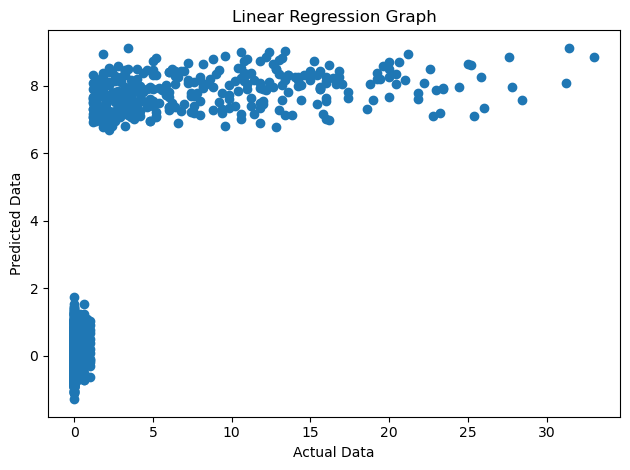

In [265]:
plt.scatter(y_test,pred)
plt.xlabel('Actual Data')
plt.ylabel('Predicted Data')
plt.title('Linear Regression Graph')
plt.tight_layout()

# Cross Validation of the Model

In [266]:
lr = LinearRegression()
lr.fit(X_train,y_train)
y_pred = lr.predict(X_test)
lss  = r2_score(y_test,y_pred)

In [267]:
# from sklearn.model_selection import cross_val_score
for j in range(2,10):
    isscore = cross_val_score(lr,x,y,cv=j)
    lsc = isscore.mean()
    print("At cv:-",j)
    print('Cross validation score is:-',lsc*100)
    print('accuracy_score is:-',lss*100)
    print('\n')

At cv:- 2
Cross validation score is:- 48.914194245491466
accuracy_score is:- 55.23587060982811


At cv:- 3
Cross validation score is:- 48.727812088932545
accuracy_score is:- 55.23587060982811


At cv:- 4
Cross validation score is:- 48.43146567420546
accuracy_score is:- 55.23587060982811


At cv:- 5
Cross validation score is:- 49.226444694777406
accuracy_score is:- 55.23587060982811


At cv:- 6
Cross validation score is:- 48.86834727846155
accuracy_score is:- 55.23587060982811


At cv:- 7
Cross validation score is:- 48.89373311754351
accuracy_score is:- 55.23587060982811


At cv:- 8
Cross validation score is:- 49.021978230786154
accuracy_score is:- 55.23587060982811


At cv:- 9
Cross validation score is:- 49.02612860674236
accuracy_score is:- 55.23587060982811




# Lets do Hyperparameter Tuning

In [268]:
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV

In [269]:
lasscv=LassoCV(alphas = None , max_iter =100,normalize=True)
lasscv.fit(X_train,y_train)

LassoCV(max_iter=100, normalize=True)

In [270]:
#best alpha paremetere
alpha=lasscv.alpha_
alpha

0.00028879242748220665

In [271]:
#Now that we have best parameter,Lets use Lasso regression and see how well our data has fitted before
lasso_reg=Lasso(alpha)
lasso_reg.fit(X_train,y_train)

Lasso(alpha=0.00028879242748220665)

In [272]:
lasso_reg.score(X_test,y_test)

0.5523402118512897

So, what its indicate now ,why we are trying Lasso regression beacuse we thought that linear regression is overfitted here also getting a same result which means that we either use a linear regression or lasso both are giving same .it means our model has not over fitted . so that conclusion is we can make here . our model is not over fitted.

# Using Ridge Regression Model.
Ridge will return best alpha and coefficients after performing 10 Cross validation.

In [273]:
# Ridge will return best alpha and coefficients after performing 10 Cross validation

ridgecv=RidgeCV(alphas =np.arange(0.001,0.1,0.01),normalize=True)
ridgecv.fit(X_train,y_train)

RidgeCV(alphas=array([0.001, 0.011, 0.021, 0.031, 0.041, 0.051, 0.061, 0.071, 0.081,
       0.091]),
        normalize=True)

In [274]:
ridgecv.alpha_

0.011

In [275]:
ridge_model = Ridge(alpha=ridgecv.alpha_)
ridge_model.fit(X_train,y_train)

Ridge(alpha=0.011)

In [276]:
ridge_model.score(X_test,y_test)

0.5523581080347532

we got around same R2 using ridge regression as well . so its safe to say there is no overfitting

In [277]:
import pickle
filename=('Pranathi Linear Regression Project 3.0(Linear Regression)')
pickle.dump(lr,open(filename,'wb'))

In [278]:
loaded_model=pickle.load(open('Pranathi Linear Regression Project 3.0(Linear Regression)','rb'))
result=loaded_model.score(X_test,y_test)
print(result*100)

55.23587060982811


In [279]:
conclusion=pd.DataFrame([loaded_model.predict(X_train)[:],pred[:]],index=['predicted','original'])

In [280]:
conclusion

0         1         2         3         4         5     \
predicted  0.527463 -0.108637  0.403966 -0.454961  7.361143 -0.277431   
original  -0.116867 -0.086389 -0.293608  8.731996 -0.008882 -0.185998   

               6         7         8         9         10        11    \
predicted -0.571136  7.090215  8.607966  0.025178  0.568538  8.345901   
original  -0.705158 -0.773291  0.179425  0.270840  7.595939 -0.097920   

               12        13        14        15        16        17    \
predicted  0.220420  7.816464 -0.354955 -0.264130  0.768656  1.234132   
original  -0.500708  1.036755  0.811626 -0.415433  7.225758  6.926159   

               18        19        20        21        22        23    \
predicted  8.436043  8.366942  0.180023  0.155030  0.329119  8.718629   
original   0.413750  0.151613  0.487840 -0.283604 -0.918808  0.464161   

               24        25        26        27        28        29    \
predicted  0.077712 -0.453860 -0.272847  0.298109  8.430269  0.017841   
original  -0.244190  0.243868  0.298793  0.109997  7.181615 -0.861798   

               30        31        32        33       34        35    \
predicted  0.095606 -0.460382  0.449238 -0.335364 -0.30439  0.355690   
original   1.007623  7.061236  8.952688  8.373157  0.49049  0.576001   

               36        37        38        39        40        41    \
predicted  0.349062 -0.273518 -0.125553  0.620819  7.763661  0.356324   
original   8.121630  1.234132 -0.406828  0.177790  0.074181  0.568461   

               42        43        44        45        46        47    \
predicted  8.751005  1.095337 -0.237331  0.862179  8.703504 -0.588308   
original  -0.690815  7.417803 -0.522650  7.936497  0.819006 -0.744743   

               48        49        50        51        52        53    \
predicted  0.960228 -0.180928  0.435219 -0.482694 -0.762560 -0.118690   
original  -0.300149 -0.525629  7.322207 -0.356563  8.193458 -0.000176   

               54        55        56        57        58        59    \
predicted  8.607802  0.335370  8.630655 -0.123537 -0.905252 -0.049617   
original  -0.160348 -0.170698 -0.181567 -0.653886  7.648569 -0.508302   

               60        61        62        63        64        65    \
predicted  7.423791 -0.518851  0.488082  0.669620  0.175368 -0.035553   
original   0.179425  0.212027  0.044465  7.493652  8.016852  6.901245   

               66        67        68        69        70        71    \
predicted  1.072845 -0.371275 -0.579351  0.309955 -0.065778  9.075855   
original   7.603727  0.676637  0.551488 -0.762015  0.082484  0.391559   

               72        73        74        75        76        77    \
predicted -0.483007  0.346906  0.425446  7.602644  0.562203 -0.152637   
original   0.181269 -0.671206  0.218506 -0.620740  1.094257 -0.086131   

               78        79        80        81        82        83    \
predicted -0.165502  7.064988  0.232583 -0.055166  0.459102  0.388472   
original  -0.349051 -0.200452  0.359692 -0.515955  1.067203  0.199539   

               84        85        86        87        88        89    \
predicted  7.332432 -1.105745  0.574564 -0.613310  0.693608  7.322263   
original   0.251982  0.441946 -0.286975 -0.525638  0.186609 -0.718008   

               90        91        92        93        94        95    \
predicted -0.034952  6.850033  0.795272  0.035709 -0.210606  0.079937   
original   7.922014  7.593865  0.264369  0.358826  0.562266 -0.877335   

               96        97        98        99        100       101   \
predicted  7.264045  0.533047  1.022174  7.241434  8.193493  8.414819   
original  -0.313193 -0.471783 -0.556565  0.418408 -0.023399  1.546151   

               102       103       104       105       106       107   \
predicted -0.300797  0.749177  7.807733  8.344105  7.668831  0.025178   
original   0.117968 -0.004709  0.227287 -0.571354  0.236251 -0.120629   

               108       109       110       111       112

In [281]:
#Intern at Pranathi
#Student of DataTrained- Saurav
#Date - 6- April - 2023
#Time - 11:48